## a file for making figures in MXene paper :)

In [17]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LogNorm
from matplotlib.patches import Patch
import ase                        
import copy
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from scipy.spatial import ConvexHull
import ast

from scipy.spatial import Delaunay
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from collections import defaultdict
from matplotlib.collections import LineCollection
from matplotlib.patches import Rectangle
import math
import networkx as nx
from matplotlib.patches import Rectangle
import sys
import os
sys.path.append(os.path.abspath('..'))

In [2]:
from functions import finding_defects as df

In [3]:
percentages = ["5", "9_1", "12_5"]
loaded_data = {}

for perc in percentages:
    fn = f"../data/stats/{perc}_percent_stats_20250623.pkl"
    with open(fn, "rb") as f:
        loaded_data[perc] = pickle.load(f)     # store *all* keys for that percent

In [4]:
df_all = pd.read_csv("all_filtered_data.csv")

In [5]:
df_all


,percent,sample_id,group,label,vac_size,category,cluster_uid,x,y,flat_cat
0,5,0,2,atom,NaN,atom,5_0_-1,259.523,6.098,['atom']
1,5,0,3,atom,NaN,atom,5_0_-1,272.182,5.855,['atom']
2,5,0,1,atom,NaN,atom,5_0_-1,284.841,5.612,['atom']
3,5,0,2,atom,NaN,atom,5_0_-1,297.501,5.369,['atom']
4,5,0,3,atom,NaN,atom,5_0_-1,310.160,5.126,['atom']
...,...,...,...,...,...,...,...,...,...,...
155115,12_5,25,2,defect,1.0,isolated vacancy,12_5_25_44,456.465,407.179,['isolated vacancy']
155116,12_5,25,3,defect,2.0,sandwich,12_5_25_45,21.790,417.100,['sandwich']
155117,12_5,25,2,defect,2.0,sandwich,12_5_25_45,9.899,417.650,['sandwich']
155118,12_5,25,2,defect,2.0,complex,12_5_25_38,407.693,480.821,['complex']


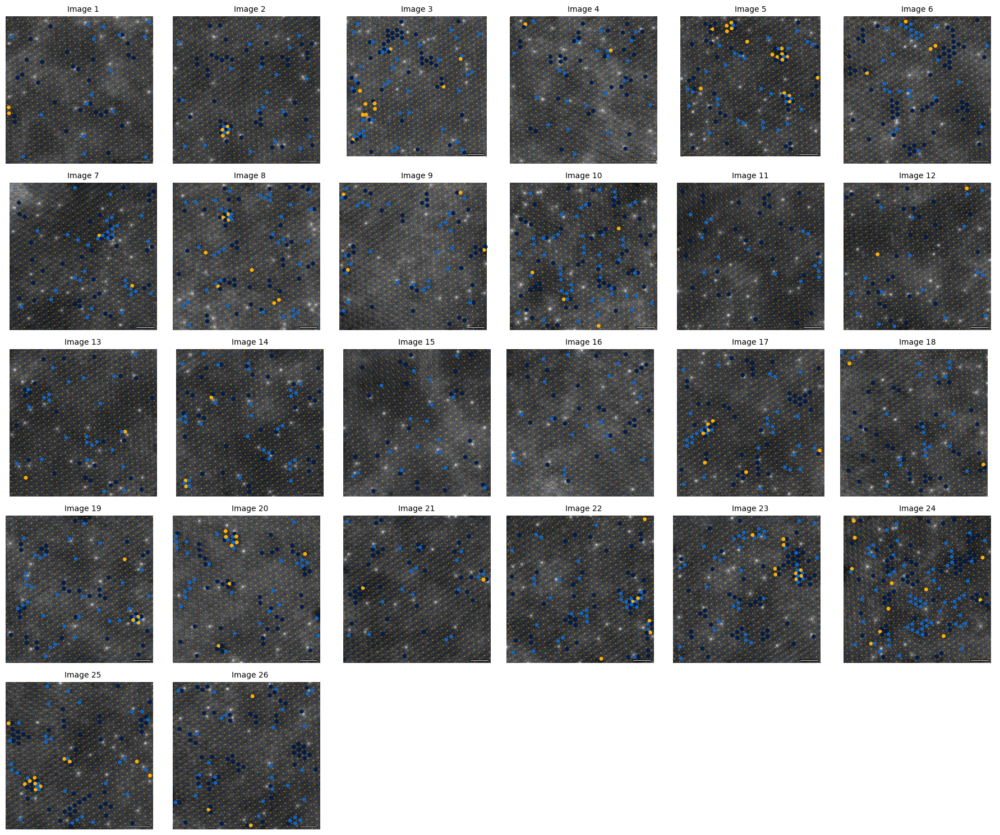

In [6]:
images_list = []
pixel_sizes = []
bar_nm = 1

# Example: colors for each group
group_colors    = {1: '#FFB000', 2: '#1366C3', 3: '#001C4D'}


percent = "12_5"  # Change this to the desired percentage
images_list = []
pixel_sizes = []
overlay_meta = []

mask = df_all["percent"].astype(str).str.replace(".", "_") == str(percent)
valid_ids = set(df_all.loc[mask, "sample_id"].dropna().astype(int))

for idx, s in enumerate(loaded_data[percent]['img_stats']):
    if idx in valid_ids:
        img = df.image_preprocess(s['image'])
        images_list.append(img)
        pixel_sizes.append(float(s['pixel_size_nm']))
        overlay_meta.append({"percent": percent, "sample_id": idx})

df.plot_grid(
    images=images_list,                # list of PIL or NumPy images
    pixel_sizes_nm_per_px=pixel_sizes, # optional scale bar
    overlay_df=df_all,          # your dataframe with percent, sample_id, group, label, x, y
    overlay_meta=overlay_meta,         # matches each image in images_list
    group_colors=group_colors,         # map groups → colors
    atom_size=1,
    defect_size=25
)


In [7]:
df_all_5 = df_all[df_all['percent'] == '12_5']
label_colors = {'atom': 'cornflowerblue', 'defect': 'red'}
i = 25
sample_id = i
subset = df_all_5[df_all_5['sample_id'] == sample_id].copy()

# Map sizes based on label
size_map = {'atom': 5, 'defect': 15}
subset['size'] = subset['label'].map(size_map)


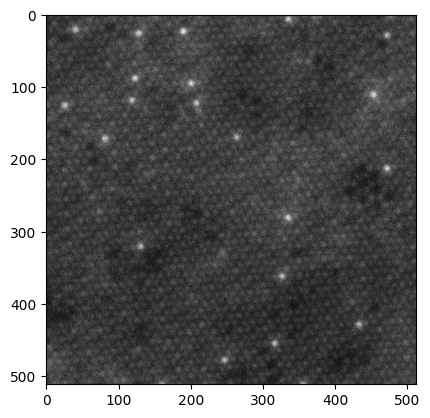

In [8]:
plt.imshow(images_list[sample_id], cmap='gray')

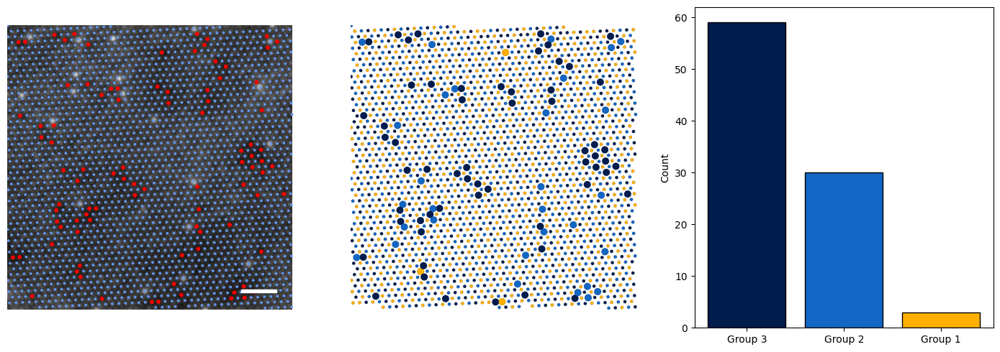

In [9]:

sample_id = i 
subset = df_all_5[df_all_5['sample_id'] == sample_id].copy()
scale_nm = 1
pixel_1 = loaded_data['12_5']['img_stats'][i]['pixel_size_nm']
scale_px = scale_nm / pixel_1



# Map point sizes
size_map = {'atom': 3, 'defect': 10}
subset['size'] = subset['label'].map(size_map)

fig, axes = plt.subplots(1, 3, figsize=(14, 5))

# Left: label color
axes[0].imshow(images_list[i], cmap='gray')

# Add label argument for each category so they appear in the legend
for lbl, color in label_colors.items():
    mask = subset['label'] == lbl
    axes[0].scatter(subset.loc[mask, 'x'], subset.loc[mask, 'y'],
                    s=subset.loc[mask, 'size'],
                    c=color, label=lbl)
bar = Rectangle((420, 475), scale_px, 5, color = "white")
axes[0].add_patch(bar)

#axes[0].legend(loc='lower left')


axes[0].axis('off')
#axes[0].set_title('Label Colors')
size_map = {'atom': 10, 'defect': 50}
subset['size'] = subset['label'].map(size_map)

# Middle: group color with red outlines for defects
# Middle: group color with black outlines for all points
axes[1].imshow(images_list[i], alpha=0)
axes[1].scatter(
    subset['x'], subset['y'],
    s=subset['size'],
    c=subset['group'].map(group_colors),
    edgecolors='black',          # ← outline every dot in black
    linewidths=0.1,              # ← tweak thickness if you like (e.g., 0.4–1.0)
    
    marker='o'                   # ensures a filled circle so the outline shows
)
axes[1].set_aspect('equal')
axes[1].axis('off')
#axes[1].set_title('Group Colors (defects outlined)')

# Right: histogram of defect group counts
defects = subset[subset['label'] == 'defect']

# Ensure all groups (1–3) appear even if empty
groups = [1, 2, 3]
counts = defects['group'].value_counts().reindex(groups, fill_value=0)

# Sort by count (largest to smallest)
counts = counts.sort_values(ascending=False)

# Colors corresponding to groups in correct order
colors = [group_colors[g] for g in counts.index]

# Plot
axes[2].bar([f'Group {g}' for g in counts.index], counts.values,
            color=colors, edgecolor='black')
#axes[2].set_title('Defect Group Histogram')
axes[2].set_xlabel('')
axes[2].set_ylabel('Count')

plt.tight_layout()
plt.show()



(155.51972799625466, 355.5197279962547, 354.9387504681648, 154.93875046816484)

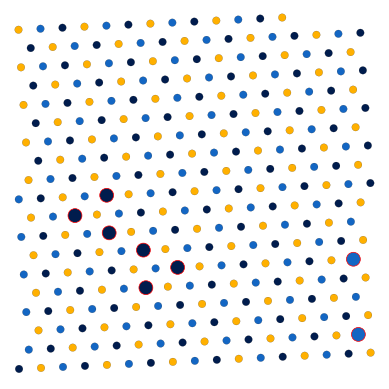

In [10]:
size_map = {'atom': 30, 'defect': 100}

subset['size'] = subset['label'].map(size_map)

# Define crop region
x_center = subset['x'].mean()
y_center = subset['y'].mean()
crop_size = 200  # adjust zoom size



x_min, x_max = x_center - crop_size / 2, x_center + crop_size / 2
y_min, y_max = y_center - crop_size / 2, y_center + crop_size / 2

# Keep only points fully inside the crop
subset_crop = subset[(subset['x'] >= x_min+4) & (subset['x'] <= x_max-4) &
                     (subset['y'] >= y_min+4) & (subset['y'] <= y_max-4)].copy()

# Plot
plt.imshow(images_list[i], alpha=0)
plt.scatter(subset_crop['x'], subset_crop['y'],
            s=subset_crop['size'],
            c=subset_crop['group'].map(group_colors),
            edgecolors=np.where(subset_crop['label'] == 'defect', 'red', 'black'),
            linewidths=np.where(subset_crop['label'] == 'defect', 0.5, .1))
plt.xlim(x_min, x_max)
plt.ylim(y_max, y_min)  # flipped for image coordinates
plt.gca().set_aspect('equal')
plt.axis('off')



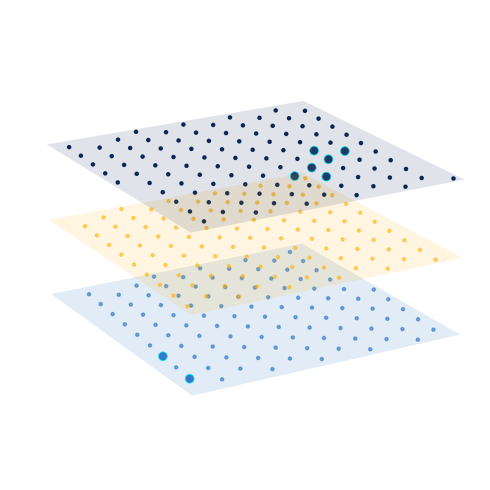

In [11]:
# --- 3D layered view for the current crop ------------------------------
plt.close('all')

from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from scipy.spatial import ConvexHull

# Use your existing layer maps (tweak if desired)
layer_z_map     = {1: 0.0, 2: -0.5, 3: 0.5}
layer_alpha_map = {1: 0.50, 2: 0.50, 3: 0.90}



# Define the crop bounds from your 2D crop
x0, x1 = x_min, x_max
y0, y1 = y_min, y_max

# Use the cropped subset as our ROI in 3D
df_roi = subset_crop.copy()

# Optional: compact point sizes for 3D so markers aren't huge
size3d_map = {'atom': 5, 'defect': 40}
if 'size' not in df_roi.columns:  # in case size not set yet
    df_roi['size'] = df_roi['label'].map({'atom': 30, 'defect': 100})
df_roi['size3d'] = df_roi['label'].map(size3d_map).fillna(10)

fig = plt.figure(figsize=(5, 5))
ax  = fig.add_subplot(111, projection='3d')
ax.set_xlim(x0, x1)
ax.set_ylim(y0, y1)

# ── atoms and defects, coloured by layer ───────────────────────────────
for lid, z in layer_z_map.items():
    ma = (df_roi['label'] == 'atom')   & (df_roi['group'] == lid)
    md = (df_roi['label'] == 'defect') & (df_roi['group'] == lid)

    # atoms (layer-colored, semi-transparent)
    ax.scatter(df_roi.loc[ma, 'x'], df_roi.loc[ma, 'y'], z,
               c=df_roi.loc[ma, 'group'].map(group_colors),
               s=df_roi.loc[ma, 'size3d'], alpha=layer_alpha_map[lid],
               depthshade=False)

    # defects (layer-colored fill, cyan outline)
    ax.scatter(df_roi.loc[md, 'x'], df_roi.loc[md, 'y'], z,
               c=df_roi.loc[md, 'group'].map(group_colors),
               s=df_roi.loc[md, 'size3d'], edgecolors='cyan', lw=.6,
               alpha=.85, depthshade=False)

    # translucent slab for the layer at z
    ax.add_collection3d(
        Poly3DCollection(
            [[(x0, y0, z), (x1, y0, z), (x1, y1, z), (x0, y1, z)]],
            facecolors=group_colors.get(lid, 'gray'), alpha=.12, edgecolor='none'
        )
    )

# ── hull around all nanopore defects (across layers) ───────────────────
# Safe check: if 'category' may be missing/NaN
cat_series = df_roi.get('category')
if cat_series is not None:
    np_mask = (df_roi['label'] == 'defect') & cat_series.astype(str).str.contains('nanopore', case=False, na=False)
else:
    np_mask = pd.Series(False, index=df_roi.index)

np_xy = df_roi.loc[np_mask, ['x', 'y']].to_numpy()

if len(np_xy) >= 3:
    hull = np_xy[ConvexHull(np_xy).vertices]
    z_low = min(layer_z_map.values()) - 0.1
    z_up  = max(layer_z_map.values()) + 0.1

    faces_top_bottom = [
        [(*p, z_low) for p in hull],
        [(*p, z_up)  for p in hull]
    ]
    faces_walls = [
        [ (hull[i][0], hull[i][1], z_low),
          (hull[(i+1)%len(hull)][0], hull[(i+1)%len(hull)][1], z_low),
          (hull[(i+1)%len(hull)][0], hull[(i+1)%len(hull)][1], z_up),
          (hull[i][0], hull[i][1], z_up) ] for i in range(len(hull))
    ]
    poly = Poly3DCollection(
        faces_top_bottom + faces_walls,
        facecolor='yellow', edgecolor='cyan', alpha=.90, linewidths=0
    )
    ax.add_collection3d(poly).set_sort_zpos(-2)

    # highlight nanopore points at their layer z
    z_np = df_roi.loc[np_mask, 'group'].map(layer_z_map).values
    ax.scatter(df_roi.loc[np_mask, 'x'], df_roi.loc[np_mask, 'y'], z_np,
               c=df_roi.loc[np_mask, 'group'].map(group_colors),
               s=np.where(df_roi.loc[np_mask, 'label'].eq('defect'), 60, 20),
               edgecolors='cyan', lw=2, depthshade=False, zorder=20)

# final touches
ax.set_zlim(min(layer_z_map.values()) - 0.2, max(layer_z_map.values()) + 0.2)
ax.axis('off')
ax.view_init(20, 60)
plt.tight_layout()
plt.show()


In [12]:
images_list = []
pixel_sizes = []
bar_nm = 1

# Example: colors for each group
group_colors = {1: 'fuchsia', 2: 'dodgerblue', 3: 'midnightblue'}


percent = "12_5"  # Change this to the desired percentage
images_list = []
pixel_sizes = []
overlay_meta = []

mask = df_all["percent"].astype(str).str.replace(".", "_") == str(percent)
valid_ids = set(df_all.loc[mask, "sample_id"].dropna().astype(int))

for idx, s in enumerate(loaded_data[percent]['img_stats']):
    if idx in valid_ids:
        img = df.image_preprocess(s['image'])
        images_list.append(img)
        pixel_sizes.append(float(s['pixel_size_nm']))
        overlay_meta.append({"percent": percent, "sample_id": idx})



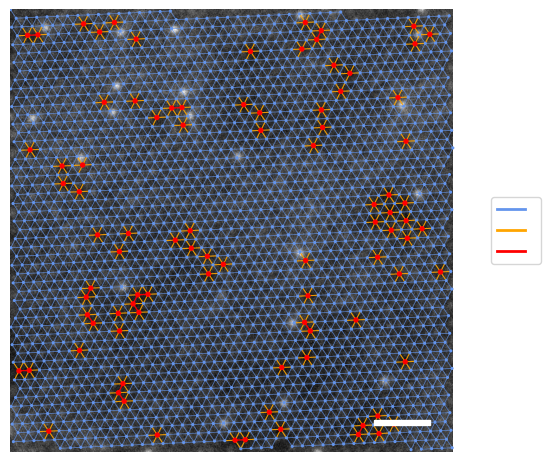

In [15]:


# Build a deduped points table that keeps labels
pts_df = subset[['x', 'y', 'label']].drop_duplicates(subset=['x', 'y']).reset_index(drop=True)
pts = pts_df[['x','y']].to_numpy()
labels = pts_df['label'].to_numpy()

if len(pts) < 3:
    print(f"Not enough points for Delaunay (need ≥3, have {len(pts)}).")
else:
    tri = Delaunay(pts)


    hull_edges = set()
    for simplex in tri.convex_hull:
        a, b = simplex
        hull_edges.add(tuple(sorted((a, b))))
    edges = set()
    for simp in tri.simplices:
        for i in range(3):
            a, b = simp[i], simp[(i+1) % 3]
            if a != b:
                e = tuple(sorted((a, b)))
                if e not in hull_edges:   # ⟵ skip outer boundary edges
                    edges.add(e)

    # Edge lengths for declutter
    edge_lengths = np.array([
        np.hypot(pts[a,0]-pts[b,0], pts[a,1]-pts[b,1]) for a,b in edges
    ])
    if len(edge_lengths):
        length_thresh = np.percentile(edge_lengths, 95)
        keep_mask = edge_lengths <= length_thresh
        edges = [e for e, keep in zip(edges, keep_mask) if keep]

    # Group edges by number of defect endpoints (0,1,2)
    segs_0, segs_1, segs_2 = [], [], []
    for a, b in edges:
        seg = [(pts[a,0], pts[a,1]), (pts[b,0], pts[b,1])]
        defect_count = (labels[a] == 'defect') + (labels[b] == 'defect')
        if defect_count == 0:
            segs_0.append(seg)
        elif defect_count == 1:
            segs_1.append(seg)
        else:  # == 2
            segs_2.append(seg)

    # Plot
    label_colors = {'atom': 'cornflowerblue', 'defect': 'red'}
    size_map = {'atom': 5, 'defect': 15}

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(images_list[sample_id], cmap='gray')
    

    # Add edge collections (under points)
    if segs_0:
        lc0 = LineCollection(segs_0, linewidths=0.6, alpha=0.7, colors='cornflowerblue')
        ax.add_collection(lc0)
    if segs_1:
        lc1 = LineCollection(segs_1, linewidths=0.8, alpha=0.9, colors='orange')
        ax.add_collection(lc1)
    if segs_2:
        lc2 = LineCollection(segs_2, linewidths=1.0, alpha=0.9, colors='red')
        ax.add_collection(lc2)

    # Points on top
    ax.scatter(
        subset['x'], subset['y'],
        s=subset['label'].map(size_map),
        c=subset['label'].map(label_colors),
        edgecolors='none',
        zorder=3
    )

    # Simple legend proxies
    from matplotlib.lines import Line2D
    legend_lines = [
        Line2D([0],[0], color='cornflowerblue', lw=2, label=''),
        Line2D([0],[0], color='orange',    lw=2, label=''),
        Line2D([0],[0], color='red',       lw=2, label=''),
    ]
    ax.legend(
        handles=legend_lines,
        loc='center left',
        bbox_to_anchor=(1.02, 0.5),
        frameon=True
    )

    scale_nm = 1
    pixel_1 = loaded_data['12_5']['img_stats'][i]['pixel_size_nm']
    scale_px = scale_nm / pixel_1
    bar = Rectangle((420, 475), scale_px, 5, color = "white", zorder = 10)
    ax.add_patch(bar)


    ax.set_axis_off()
    #ax.set_title("Delaunay edges colored by defect-endpoint count")
    plt.show()


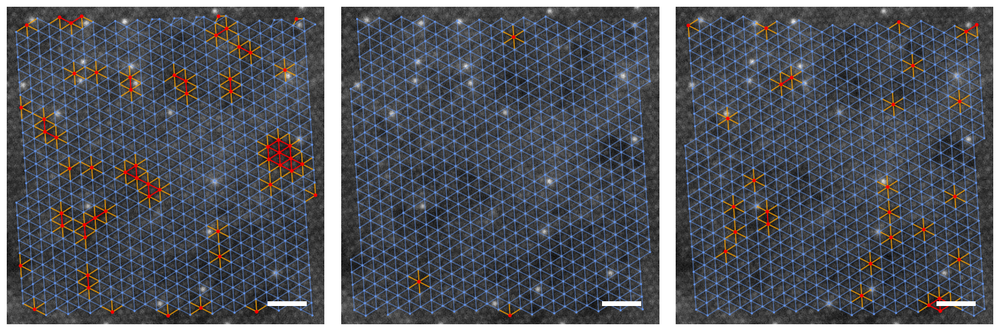

(<Figure size 1500x500 with 3 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >]], dtype=object))

In [18]:

def plot_delaunay_by_group(
    subset, img, *,
    group_colors=None,
    group_order=None,       # e.g., ['3','1','2'] or [3,1,2]
    plot_points=True,
    plot_edges=True,
    margin_px=0,            # skip points/edges within this many px of the image border
    declutter_pct=95,       # None to keep all edges
    # --- scale bar: same units/structure as your example ---
    add_scale_bar=False,
    scale_px=None,          # bar length IN PIXELS (you compute outside)
    bar_xy=None,            # (x, y) lower-left IN PIXELS (e.g., (420, 475))
    bar_height_px=5,
    bar_color='white',
    scale_bar_each="first"  # "first" or "all"
):
    """Plot one panel per group with Delaunay edges colored by defect-endpoint count.
       Edges: 0->cornflowerblue, 1->orange, 2->red.
       Scale bar uses pixel units and explicit (x, y) like your manual snippet.
    """
    label_colors = {'atom': 'cornflowerblue', 'defect': 'red'}
    size_map     = {'atom': 5, 'defect': 15}

    subset = subset.copy()
    subset['group_str'] = subset['group'].astype(str)
    available = subset['group_str'].dropna().unique().tolist()

    if group_order is not None:
        desired = [str(g) for g in group_order]
        groups = [g for g in desired if g in available]
    else:
        groups = sorted(available)

    n = len(groups)
    if n == 0:
        print(f"No matching groups. Available: {sorted(available)}")
        return None, None

    ncols = min(3, n)
    nrows = math.ceil(n / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows), squeeze=False)

    H, W = img.shape[:2]

    def _add_scalebar_like_example(ax):
        if not (add_scale_bar and scale_px is not None and bar_xy is not None):
            return
        x, y = bar_xy
        ax.add_patch(Rectangle((float(x), float(y)),
                               float(scale_px), float(bar_height_px),
                               facecolor=bar_color, edgecolor='none',
                               zorder=10, clip_on=False))

    for idx, g in enumerate(groups):
        ax = axes[idx // ncols][idx % ncols]
        ax.imshow(img, cmap='gray')  # same coord system as your example
        ax.set_axis_off()

        sub_g = (subset.loc[subset['group_str'] == g, ['x','y','label']]
                        .drop_duplicates(subset=['x','y'])
                        .copy())

        if margin_px > 0:
            sub_g = sub_g[
                (sub_g['x'] >= margin_px) & (sub_g['x'] <= W - margin_px) &
                (sub_g['y'] >= margin_px) & (sub_g['y'] <= H - margin_px)
            ]

        pts = sub_g[['x','y']].to_numpy()
        labels = sub_g['label'].to_numpy()

        if plot_edges and len(pts) >= 3:
            tri = Delaunay(pts)
            edges = set()
            for s in tri.simplices:
                a,b,c = s
                edges.update({tuple(sorted((a,b))), tuple(sorted((b,c))), tuple(sorted((c,a)))})
            edges = list(edges)

            if declutter_pct is not None and len(edges):
                a_idx = np.array([a for a,b in edges])
                b_idx = np.array([b for a,b in edges])
                L = np.hypot(pts[a_idx,0] - pts[b_idx,0], pts[a_idx,1] - pts[b_idx,1])
                thresh = np.percentile(L, declutter_pct)
                edges = [e for e, l in zip(edges, L) if l <= thresh]

            segs_0, segs_1, segs_2 = [], [], []
            for a, b in edges:
                seg = [(pts[a,0], pts[a,1]), (pts[b,0], pts[b,1])]
                dcount = (labels[a]=='defect') + (labels[b]=='defect')
                (segs_0 if dcount==0 else segs_1 if dcount==1 else segs_2).append(seg)

            if segs_0:
                ax.add_collection(LineCollection(segs_0, linewidths=1, alpha=0.6, colors='cornflowerblue'))
            if segs_1:
                ax.add_collection(LineCollection(segs_1, linewidths=1.2, alpha=0.8, colors='orange'))
            if segs_2:
                ax.add_collection(LineCollection(segs_2, linewidths=1.3, alpha=0.9, colors='red'))

        if plot_points and len(sub_g):
            ax.scatter(
                sub_g['x'], sub_g['y'],
                s=sub_g['label'].map(size_map),
                c=sub_g['label'].map(label_colors),
                edgecolors='none', zorder=3
            )

        # scale bar placement per setting
        if scale_bar_each == "all" or (scale_bar_each == "first" and idx == 0):
            _add_scalebar_like_example(ax)

        # optional colored title
        tcolor = None
        if group_colors:
            if g in group_colors:
                tcolor = group_colors[g]
            else:
                try:
                    gi = int(float(g))
                    tcolor = group_colors.get(gi, None)
                except Exception:
                    pass
        ax.set_title("")


    # hide unused axes
    for j in range(n, nrows*ncols):
        axes[j // ncols][j % ncols].set_visible(False)

    plt.tight_layout()
    plt.show()
    return fig, axes

pixel_1 = loaded_data['12_5']['img_stats'][sample_id]['pixel_size_nm']  # nm per px
scale_nm = 1.0
scale_px = scale_nm / pixel_1           # pixels for a 1 nm bar
bar_xy   = (420, 475)                   # lower-left, in pixels

plot_delaunay_by_group(
    subset, images_list[sample_id],
    group_colors=group_colors,
    group_order=['3', '1', '2'],
    margin_px=14,
    declutter_pct=90,
    add_scale_bar=True,
    scale_px=scale_px,
    bar_xy=bar_xy,
    bar_height_px=7,
    bar_color='white',
    scale_bar_each="all", 
)


In [19]:

def plot_delaunay_3d_layers(
    subset, img, *,
    plot_points=True,
    plot_edges=True,
    margin_px=0,
    declutter_pct=95,
    layer_gap=1.0,
    elev=20, azim=-60
):
    """
    3D visualization of groups 3, 1, and 2 stacked along z.
      • Group 3 = top, Group 1 = middle, Group 2 = bottom
      • Edges colored: 0→cornflowerblue, 1→orange, 2→red
      • Points colored: atom→cornflowerblue, defect→red
      • No axes/ticks/grid
    """
    label_colors = {'atom': 'cornflowerblue', 'defect': 'red'}
    size_map     = {'atom': 5, 'defect': 15}

    df = subset.copy()
    df['group_str'] = df['group'].astype(str)
    zmap = {'3': +layer_gap, '1': 0.0, '2': -layer_gap}

    df = df[df['group_str'].isin(zmap.keys())].drop_duplicates(subset=['x','y','group_str'])
    H, W = img.shape[:2]

    if margin_px > 0:
        df = df[
            (df['x'] >= margin_px) & (df['x'] <= W - margin_px) &
            (df['y'] >= margin_px) & (df['y'] <= H - margin_px)
        ]

    fig = plt.figure(figsize=(7, 6))
    ax = fig.add_subplot(111, projection='3d')
    ax.view_init(elev=elev, azim=azim)

    ax.set_xlim(0, W)
    ax.set_ylim(H, 0)
    ax.set_zlim(-layer_gap*1.5, layer_gap*1.5)

    # turn off all axes, ticks, and grid
    ax.set_axis_off()
    ax.grid(False)
    ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])

    def tri_edges(pts, labels, pct):
        if len(pts) < 3: return [], [], []
        tri = Delaunay(pts)
        edges = {tuple(sorted((a,b))) for s in tri.simplices for a,b in [(s[0],s[1]),(s[1],s[2]),(s[2],s[0])]}
        edges = list(edges)
        if pct is not None and edges:
            a_idx = np.array([a for a,b in edges])
            b_idx = np.array([b for a,b in edges])
            L = np.hypot(pts[a_idx,0]-pts[b_idx,0], pts[a_idx,1]-pts[b_idx,1])
            edges = [e for e,l in zip(edges,L) if l <= np.percentile(L,pct)]
        segs_0,segs_1,segs_2=[],[],[]
        for a,b in edges:
            seg=[(pts[a,0],pts[a,1]),(pts[b,0],pts[b,1])]
            dcount=(labels[a]=='defect')+(labels[b]=='defect')
            (segs_0 if dcount==0 else segs_1 if dcount==1 else segs_2).append(seg)
        return segs_0,segs_1,segs_2

    def lift(segs2d,z):
        return [[(x1,y1,z),(x2,y2,z)] for ( (x1,y1),(x2,y2) ) in segs2d]

    for g in ['3','1','2']:
        dg = df[df['group_str']==g]
        if dg.empty: continue
        z = zmap[g]

        if plot_points:
            ax.scatter(
                dg['x'], dg['y'], np.full(len(dg), z),
                s=dg['label'].map(size_map),
                c=dg['label'].map(label_colors),
                depthshade=True, alpha=0.6
            )

        if plot_edges:
            pts = dg[['x','y']].to_numpy()
            labels = dg['label'].to_numpy()
            segs_0,segs_1,segs_2 = tri_edges(pts, labels, declutter_pct)

            if segs_0:
                ax.add_collection3d(Line3DCollection(lift(segs_0,z), linewidths=0.6, alpha=0.4, colors='cornflowerblue'))
            if segs_1:
                ax.add_collection3d(Line3DCollection(lift(segs_1,z), linewidths=0.8, alpha=0.6, colors='orange'))
            if segs_2:
                ax.add_collection3d(Line3DCollection(lift(segs_2,z), linewidths=1.0, alpha=0.6, colors='red'))

    plt.tight_layout()
    plt.show()
    return fig, ax


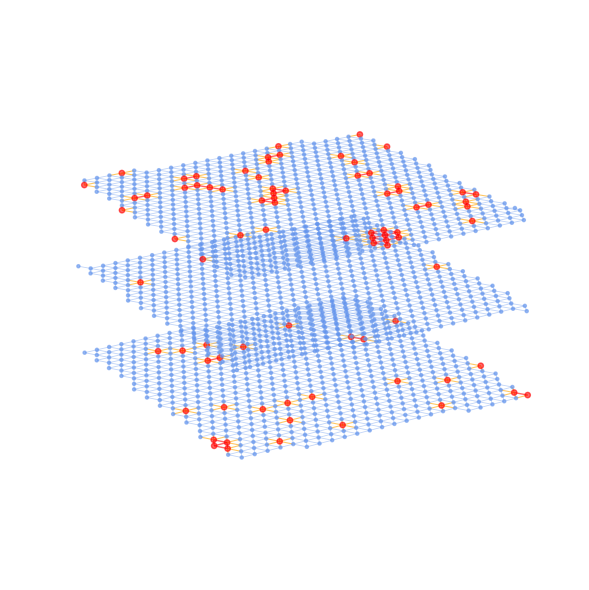

In [20]:
fig3d, ax3d = plot_delaunay_3d_layers(
    subset, images_list[i],
    plot_points=True,
    plot_edges=True,
    margin_px=20,
    declutter_pct=90,
    layer_gap=1,   # increase/decrease vertical separation
    elev=20, azim=-30

)


Batch 1/1

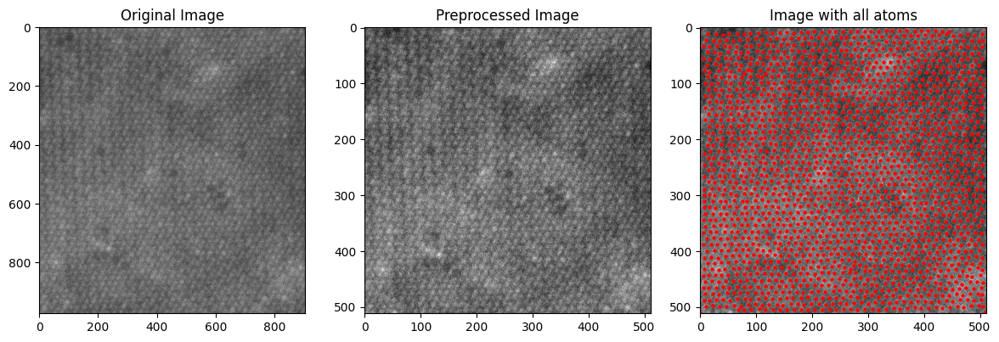

In [ ]:
preprocessed_image, points = df.find_all_points_ensemble(images[0], lattice_finder_model)
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(np.array(images[0]), cmap='gray')
axes[0].set_title('Original Image')
axes[1].imshow(preprocessed_image, cmap='gray')
axes[1].set_title('Preprocessed Image')
axes[2].imshow(preprocessed_image, cmap='gray')
axes[2].scatter(points[:, 0], points[:, 1], s=5, c='r')
axes[2].set_title('Image with all atoms')
plt.tight_layout()

Batch 1/1
1 image was decoded in approximately 0.1751 seconds


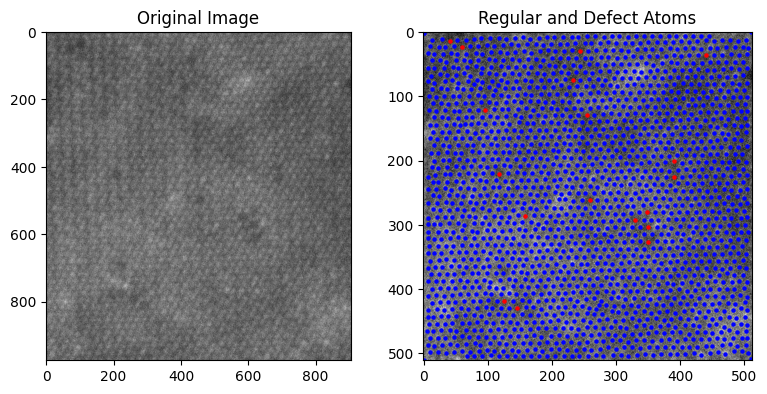

In [ ]:
defect_mask =df.make_defect_mask(images[0], defect_finder_model)
regular, defects = df.split_points_by_mask(points, defect_mask)

fig, axes = plt.subplots(1, 2, figsize=(8, 4)) 
axes[1].imshow(preprocessed_image, cmap='gray')
axes[1].scatter(regular[:, 0], regular[:, 1], s=5, c='b', label='Regular')
axes[1].scatter(defects[:, 0], defects[:, 1], s=5, c='r', label='Defects')
axes[1].set_title('Regular and Defect Atoms')

axes[0].imshow(np.array(images[0]), cmap='gray')
axes[0].set_title('Original Image')

plt.tight_layout()


#### 2d gaussian fitting

In [ ]:
distance = 5
hs_img = hs.signals.Signal2D(preprocessed_image)
atom_positions = am.get_atom_positions(hs_img, distance)
hs_data = pd.DataFrame(atom_positions, columns=['x', 'y'])

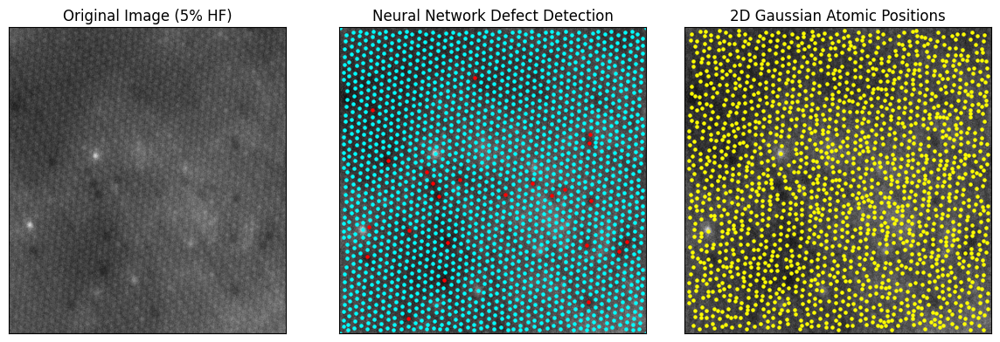

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Original image
axes[0].imshow(np.array(images[0]), cmap='gray')
axes[0].set_title('Original Image (5% HF)')

# Regular and Defect Atoms
axes[1].imshow(preprocessed_image, cmap='gray')
axes[1].scatter(regular[:, 0], regular[:, 1], s=5, c='cyan', label='Regular')
axes[1].scatter(defects[:, 0], defects[:, 1], s=5, c='r', label='Defects')
axes[1].set_title('Neural Network Defect Detection')

# Atomap positions
axes[2].imshow(preprocessed_image, cmap='gray')
axes[2].scatter(atom_positions[:, 0], atom_positions[:, 1], s=5, c='yellow', label='Atomap')
axes[2].set_title('2D Gaussian Atomic Positions')

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()

In [ ]:
df_def = df_all.query("label=='defect'").copy()

In [10]:
def flatten_cat(tags):
    # if tags is a string like "['same_layer_3','multilayer']", parse it
    if isinstance(tags, str):
        try:
            tags = ast.literal_eval(tags)
        except Exception:
            tags = [tags]

    # now tags is guaranteed to be a list
    # 1) nanopore or isolated stand alone
    if 'nanopore' in tags:
        return ['nanopore']
    if 'isolated vacancy' in tags:
        return ['isolated vacancy']

    # 2) keep any non-same_layer tags (e.g. inter_layer, multilayer)
    new_tags = [t for t in tags if not t.startswith('same_layer')]

    # 3) collapse any same_layer_* into one within_layer
    if any(t.startswith('same_layer') for t in tags):
        new_tags.append('within_layer')

    # 4) if nothing left (e.g. only same_layer), default to within_layer
    if not new_tags:
        new_tags = ['within_layer']

    return new_tags




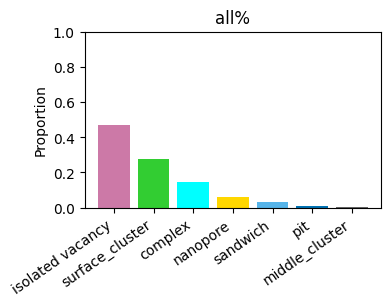

In [11]:
per  = "all"
#df_all1 = df_all[df_all["percent"] == f"{per}"].copy()      # boolean mask
df_all1 = df_all
df_all1["flat_cat"] = df_all1["category"].apply(flatten_cat)
cat_palette = {
    "isolated vacancy": "#CC79A7",  # magenta
    "surface_cluster":  "limegreen",
    "complex":          'cyan',
    "nanopore":         "gold",
    "sandwich":         "#56B4E9",  # sky-blue
    "pit":              "#0072B2",  # deep-blue
    "middle_cluster":   "#666666",  # gray
}





from matplotlib.colors import to_rgb, to_hex
blend = lambda c1, c2: to_hex([(a + b) / 2 for a, b in zip(to_rgb(c1), to_rgb(c2))])



# ----- counts -------------------------------------------------------------
counts = (df_all1["flat_cat"]
            .apply(lambda lst: ", ".join(lst))          # list → string
            .value_counts()
            .sort_index())

# keep defined order in palette_all
cats = [c for c in cat_palette if c in counts.index]
vals = counts.reindex(cats, fill_value=0)

# proportions instead of raw counts
props = vals / vals.sum()

fig, ax = plt.subplots(figsize=(4, 3))
ax.bar(range(len(cats)), props, color=[cat_palette[c] for c in cats])

ax.set_xticks(range(len(cats)))
ax.set_xticklabels(cats, rotation=35, ha="right")
ax.set_ylabel("Proportion")
ax.set_ylim(0, 1)                    # 0–1 scale
plt.tight_layout()
plt.title(f"{per}%" )
plt.show()

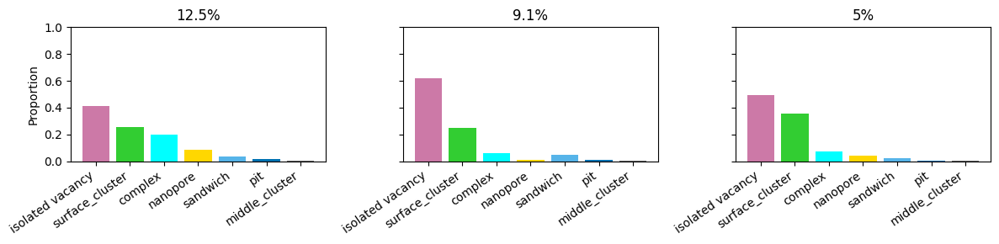

In [12]:
# make three side-by-side proportion bars for per = 12_5, 9_1, 5
per_list = ["12_5", "9_1", "5"]
cats = list(cat_palette.keys())

fig, axes = plt.subplots(1, 3, figsize=(12, 3), sharey=True)

for ax, per in zip(axes, per_list):
    df_all1 = df_all[df_all["percent"] == per].copy()
    df_all1["flat_cat"] = df_all1["category"].apply(flatten_cat)

    counts = (df_all1["flat_cat"]
                .apply(lambda lst: ", ".join(lst))
                .value_counts())

    vals = counts.reindex(cats, fill_value=0)
    total = vals.sum()
    props = (vals / total) if total else vals

    ax.bar(range(len(cats)), props, color=[cat_palette[c] for c in cats])
    ax.set_xticks(range(len(cats)))
    ax.set_xticklabels(cats, rotation=35, ha="right")
    ax.set_ylim(0, 1)
    ax.set_title(f"{per.replace('_', '.')}%")

axes[0].set_ylabel("Proportion")
plt.tight_layout()
plt.show()


In [13]:
per_list = ["12_5", "9_1", "5"]
rows = []

for per in per_list:
    df_all1 = df_all[df_all["percent"] == per].copy()
    df_all1["flat_cat"] = df_all1["category"].apply(flatten_cat)

    defects = df_all1[df_all1["category"] != "atom"].copy()
    total_def = len(defects)

    iso = defects["flat_cat"].apply(lambda lst: "isolated vacancy" in lst).sum() / total_def if total_def else 0
    surf = defects["flat_cat"].apply(lambda lst: "surface_cluster" in lst).sum() / total_def if total_def else 0
    comp = defects["flat_cat"].apply(lambda lst: any(k in lst for k in {"complex","sandwich","pit"})).sum() / total_def if total_def else 0
    nano = defects["flat_cat"].apply(lambda lst: "nanopore" in lst).sum() / total_def if total_def else 0

    rows.append([per.replace("_", "."), iso, 1 - iso, surf, comp, nano])

table = pd.DataFrame(rows, columns=[
    "percent", "isolated vacancy", "1 - isolated", "surface", "complex (complex+sandwich+pit)", "nanopore"
])
table

,percent,isolated vacancy,1 - isolated,surface,complex (complex+sandwich+pit),nanopore
0,12.5,0.409461,0.590539,0.256358,0.247202,0.082909
1,9.1,0.617211,0.382789,0.247774,0.117211,0.010386
2,5,0.496680,0.503320,0.355910,0.100930,0.041169


In [14]:
# overall defect percentage (of all atoms) for per = 12_5, 9_1, 5
per_list = ["12_5", "9_1", "5"]
rows = []

for per in per_list:
    dfp = df_all[df_all["percent"] == per].copy()
    dfp["flat_cat"] = dfp["category"].apply(flatten_cat)
    total = len(dfp)

    n_def = (dfp["category"] != "atom").sum()
    surface = dfp["flat_cat"].apply(lambda lst: "surface_cluster" in lst).sum()
    complex_ = dfp["flat_cat"].apply(lambda lst: any(k in lst for k in {"complex","sandwich","pit"})).sum()
    nanopore = dfp["flat_cat"].apply(lambda lst: "nanopore" in lst).sum()

    rows.append([
        per.replace("_","."),
        (100 * n_def / total) if total else 0,
        (100 * surface / total) if total else 0,
        (100 * complex_ / total) if total else 0,
        (100 * nanopore / total) if total else 0
    ])

table = pd.DataFrame(rows, columns=[
    "percent",
    "defects_%_of_all",
    "surface_%_of_all",
    "complex_%_of_all",
    "nanopore_%_of_all"
])
print(table)


  percent  defects_%_of_all  surface_%_of_all  complex_%_of_all  \
0    12.5          3.492690          0.895379          0.863401   
1     9.1          1.481384          0.367049          0.173634   
2       5          1.411884          0.502503          0.142501   

   nanopore_%_of_all  
0           0.289577  
1           0.015385  
2           0.058125  


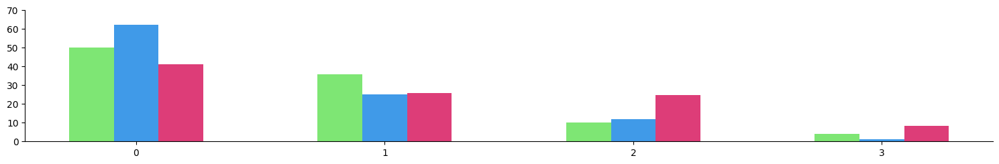

In [15]:
import numpy as np
# NEW: palette keyed by percent group
per_palette = {
    "12_5": "#D81B60",  # blue (CVD-safe)
    "9_1":  "#1E88E5",  # magenta (CVD-safe)
    "5":    "#67E25C",  # bluish-green (CVD-safe)
}
pers   = [ "5", "9_1", "12_5"]
bw     = 0.18                                  # bar-width

# keep your preferred order and count correctly after merging “pit” & “sandwich”
cats  = ["isolated vacancy", "surface_cluster", "complex", "nanopore"]
locs  = np.arange(len(cats))
merge = lambda c: "complex" if c in ("pit", "sandwich") else c     # merge rule

fig, ax = plt.subplots(figsize=(15, 2.5))

for i, per in enumerate(pers):
    df_sub = df_all if per == "all" else df_all[df_all["percent"] == per]

    props = (df_sub["flat_cat"]
               .apply(lambda lst: [merge(c) for c in lst])
               .explode()
               .value_counts()
               .reindex(cats, fill_value=0)
             )
    props = (props / props.sum()) * 100  # convert to percent

    xoffs = locs + (i - (len(pers) - 1) / 2) * bw
    ax.bar(xoffs, props.values, width=bw,
           color=per_palette[per], alpha=.85, label=per)

ax.set_xticks(locs)
#ax.set_xticklabels(['Isolated', 'Surface cluster', 'Complex', 'Nanopore'], fontsize=15)
#ax.set_ylabel("Percentage (%)", fontsize=14)  # y-axis label
ax.set_ylim(0, 70)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.legend(title="HF Concentration", frameon=False)

plt.tight_layout()



In [16]:
from tabulate import tabulate

cats  = ["isolated vacancy", "surface_cluster", "complex", "nanopore"]
pers  = [ "5", "9_1", "12_5"]

table_data = []

for per in pers:
    df_sub = df_all[df_all["percent"] == per]
    props = (df_sub["flat_cat"]
               .apply(lambda lst: ["complex" if c in ("pit", "sandwich") else c for c in lst])
               .explode()
               .value_counts()
               .reindex(cats, fill_value=0))
    props /= props.sum()
    props *= 100  # convert to percent
    table_data.append(props.values)

print(tabulate(
    [[per] + list(vals) for per, vals in zip(pers, table_data)],
    headers=["percent"] + cats,
    floatfmt=".2f"
))


  percent    isolated vacancy    surface_cluster    complex    nanopore
---------  ------------------  -----------------  ---------  ----------
        5               49.93              35.78      10.15        4.14
      9_1               62.18              24.96      11.81        1.05
     12_5               41.11              25.74      24.82        8.32


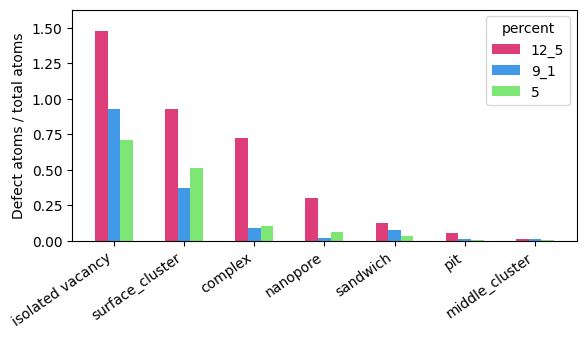

In [17]:
# ── defect-to-atom proportions, grouped histogram ─────────────────────────
pers   = [ "12_5", "9_1", "5"]
cats   = [c for c in cat_palette]         # keep palette order
locs   = np.arange(len(cats))
bw     = 0.18

fig, ax = plt.subplots(figsize=(6, 3.5))
pmax = 0

for i, per in enumerate(pers):
    df_sub = df_all if per == "all" else df_all[df_all["percent"] == per]

    atoms_tot = (df_sub["label"] == "atom").sum()           # denom.

    cat_cnts = (df_sub.query("label=='defect'")             # numerators
                     ["flat_cat"]
                     .apply(lambda lst: ", ".join(lst))
                     .value_counts()
                     .reindex(cats, fill_value=0))

    props = 100* cat_cnts / atoms_tot
    pmax  = max(pmax, props.max())

    xoffs = locs + (i - (len(pers) - 1) / 2) * bw
    ax.bar(xoffs, props.values, width=bw,
           color=per_palette[per], label=per, alpha=.85)

ax.set_xticks(locs)
ax.set_xticklabels(cats, rotation=35, ha="right")
ax.set_ylabel("Defect atoms / total atoms")
ax.set_ylim(0, pmax * 1.1)
ax.legend(title="percent")
plt.tight_layout()
plt.show()


In [18]:
df_def['category'].value_counts()

category
isolated vacancy    1595
surface_cluster      939
complex              487
nanopore             201
sandwich             118
pit                   36
middle_cluster        17
Name: count, dtype: int64

In [19]:
# colour maps -------------------------------------------------------------
group_color    = {1: '#FFB000', 2: '#1366C3', 3: '#001C4D'}
cluster_colors = ["orange", "#4daf4a", "#f781bf", "#e41a1c"]   # vac-size 1-4

# data --------------------------------------------------------------------
img22  = df_def.query("percent == '12_5' and sample_id == 16").copy()
image  = np.load("app/data/12_5_images/image_12_5_16.npy")

# cropping window (pixel coords) -----------------------------------------
#x0, x1 = 190, 512
#y0, y1 = 80, 450

x0, x1 = 0, 300
y0, y1 = 200, 500

img_crop = image[y0:y1, x0:x1]

mask          = (img22["x"].between(x0, x1)) & (img22["y"].between(y0, y1))
sub           = img22.loc[mask]
sub["rel_x"]  = sub["x"] - x0
sub["rel_y"]  = sub["y"] - y0
sub["flat_cat"] = sub["category"].apply(flatten_cat)

vac_colors    = np.array(cluster_colors)[sub["vac_size"].astype(int).to_numpy() - 1]
# helper legends ----------------------------------------------------------
grp_labels = ["Middle Layer", "Outer Layer (min)", "Outer Layer (max)"]
vac_labels = ["1", "2", "3 ", "4+ "]
cat_labels = [k.replace('_', ' ') for k in cat_palette]

grp_handles = [Patch(color=group_color[g]) for g in [1, 2, 3]]
vac_handles = [Patch(color=c) for c in cluster_colors]
cat_handles = [Patch(color=c) for c in cat_palette.values()]


/var/folders/fq/mzw5cbdd00ngfgjzxd290glstylzhn/T/ipykernel_6022/1137749223.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub["rel_x"]  = sub["x"] - x0
/var/folders/fq/mzw5cbdd00ngfgjzxd290glstylzhn/T/ipykernel_6022/1137749223.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub["rel_y"]  = sub["y"] - y0
/var/folders/fq/mzw5cbdd00ngfgjzxd290glstylzhn/T/ipykernel_6022/1137749223.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_ind

## scale bar

In [20]:
bar_nm = .5
px_nm = loaded_data['12_5']['img_stats'][16]['pixel_size_nm']
bar_px = int(bar_nm / px_nm) 

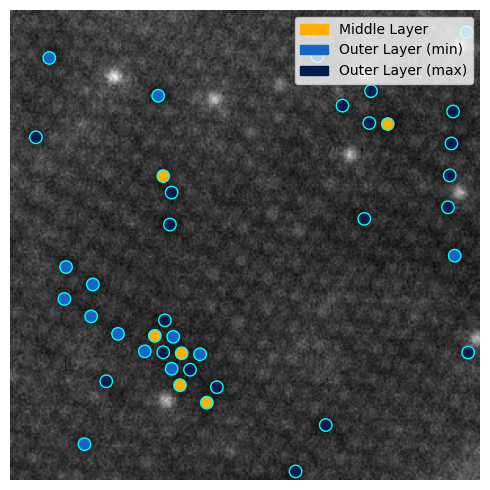

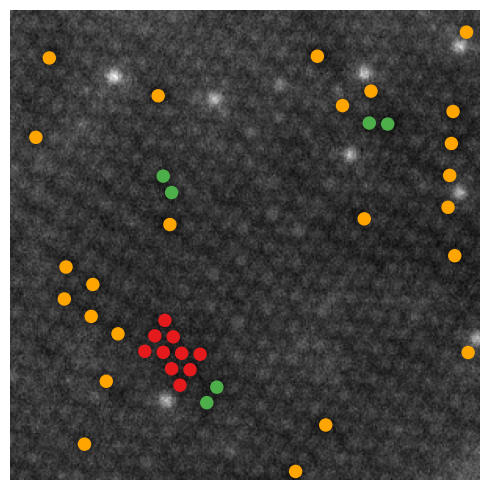

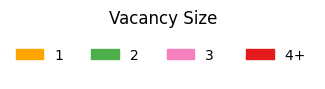

/var/folders/fq/mzw5cbdd00ngfgjzxd290glstylzhn/T/ipykernel_6022/1483809344.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub["flat_cat"] = sub["flat_cat"].apply(


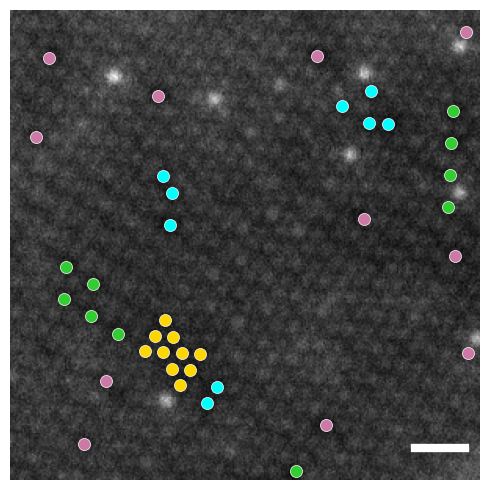

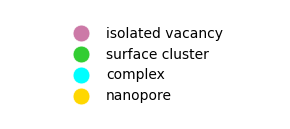

In [21]:
fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(img_crop, cmap="gray", origin="lower")
ax.scatter(sub["rel_x"], sub["rel_y"],
           c=sub["group"].map(group_color), s=80,
           edgecolor='cyan', linewidth=1)
ax.axis("off")
ax.legend(grp_handles, grp_labels, loc='upper right')
plt.tight_layout()
plt.show()

# Vacancy size
fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(img_crop, cmap="gray", origin="lower")
ax.scatter(sub["rel_x"], sub["rel_y"], c=vac_colors, s=75)
ax.axis("off")
plt.tight_layout()

# separate legend
fig_leg, ax_leg = plt.subplots(figsize=(2, 1))
ax_leg.legend(vac_handles, vac_labels, loc="center", ncol=len(vac_labels),  frameon=False)
ax_leg.axis("off")
ax_leg.set_title("Vacancy Size")
plt.tight_layout()
plt.show()


fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(img_crop, cmap="gray", origin="lower")

# ── merge pit & sandwich → complex, drop middle_cluster ──
sub["flat_cat"] = sub["flat_cat"].apply(
    lambda tags: [ {"pit":"complex", "sandwich":"complex"}.get(t, t)
                   for t in tags if t != "middle_cluster"]
)

# ── keep one palette entry for complex, discard unused ones ──
cat_palette = {k: v for k, v in cat_palette.items()
               if k not in ("pit", "sandwich", "middle_cluster")}

# Then the single tags
for cat, color in cat_palette.items():
    # build a boolean series for “has this tag” and then mask out the both-case
    has_tag    = sub["flat_cat"].apply(lambda tags: cat in tags)

    ax.scatter(
        sub.loc[has_tag, "rel_x"],
        sub.loc[has_tag, "rel_y"],
        c=color, s=75,
        edgecolor="white", linewidth=.5,
        label=cat.replace("_"," ")
    )

ax.axis("off")
#ax.legend(loc="lower right", fontsize = 12)
h, w = img_crop.shape[:2]
xbar0 = w - bar_px - 10
xbar1 = w - 10
ybar  = 20

ax.plot([xbar0, xbar1], [ybar, ybar], color='white', lw=6)

plt.tight_layout()
plt.show()

handles, labels = ax.get_legend_handles_labels()

fig_leg, ax_leg = plt.subplots(figsize=(3, 1.4))
ax_leg.legend(handles, labels,
              loc="center",
              frameon=False,
              ncol=1,
              markerscale=1.4)                       # bigger dots in legend

ax_leg.axis("off")
plt.tight_layout()



(-0.5, 299.5, -0.5, 299.5)

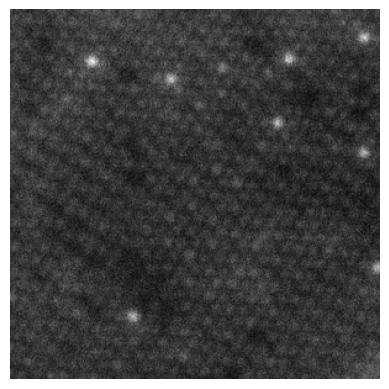

In [22]:
plt.imshow(img_crop, cmap="gray", origin="lower")
#plt.scatter(sub["rel_x"], sub["rel_y"], c="red", s=10, label = "Defect (12.5% HF Sample)")
#plt.legend()
plt.axis("off")

In [23]:
img22_all  = df_all.query("percent == '12_5' and sample_id == 16").copy()


(-0.5, 299.5, -0.5, 299.5)

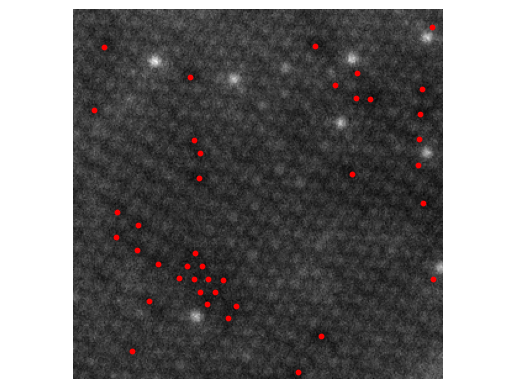

In [24]:
plt.imshow(img_crop, cmap="gray", origin="lower")


atom_mask = (sub['label'] == 'atom') 


defect_mask = (sub['label'] == 'defect')

plt.scatter(sub.loc[atom_mask, 'rel_x'],
            sub.loc[atom_mask, 'rel_y'],
            c='cornflowerblue', s=5, alpha=1)

plt.scatter(sub.loc[defect_mask, 'rel_x'],
            sub.loc[defect_mask, 'rel_y'],
            c='red', s=10)


plt.axis('off')
plt.axis('equal')



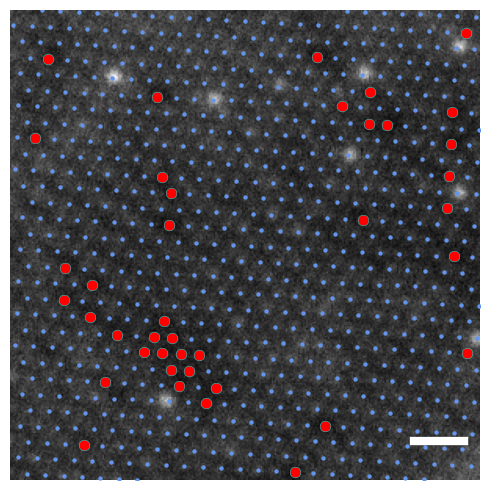

In [25]:
# masks limited to crop
crop     = img22_all['x'].between(x0, x1) & img22_all['y'].between(y0, y1)
mask_def = (img22_all['label'] == 'defect') & crop
mask_atm = (img22_all['label'] == 'atom')   & crop

# Scatter plot
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111)

# optionally show image background
ax.imshow(img_crop, cmap='gray', origin='lower', extent=[x0, x1, y0, y1])

# defects ─ cyan outline, larger
ax.scatter(
    img22_all.loc[mask_def, 'x'],
    img22_all.loc[mask_def, 'y'],
    c='red',
    s=60, edgecolors='cyan', linewidth=.3, zorder=1
)

# atoms ─ no outline, smaller
ax.scatter(
    img22_all.loc[mask_atm, 'x'],
    img22_all.loc[mask_atm, 'y'],
    c='cornflowerblue',
    s=10, edgecolors='white', linewidth=0, zorder=2
)

h, w = img_crop.shape[:2]
xbar0 = w - bar_px - 10
xbar1 = w - 10
ybar  = h - 75

ax.plot([xbar0, xbar1], [ybar, ybar], color='white', lw=6)


ax.set_xlim(x0, x1)
ax.set_ylim(y0, y1)
ax.axis('off')
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

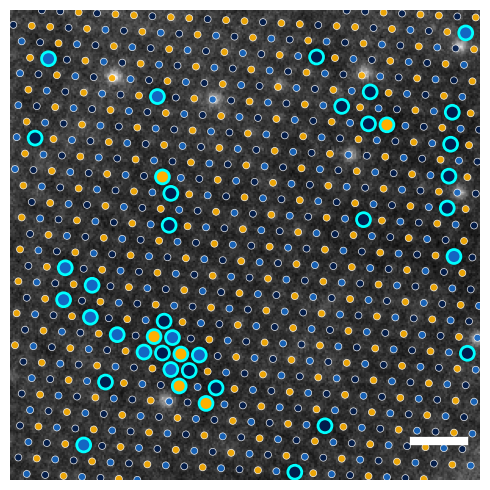

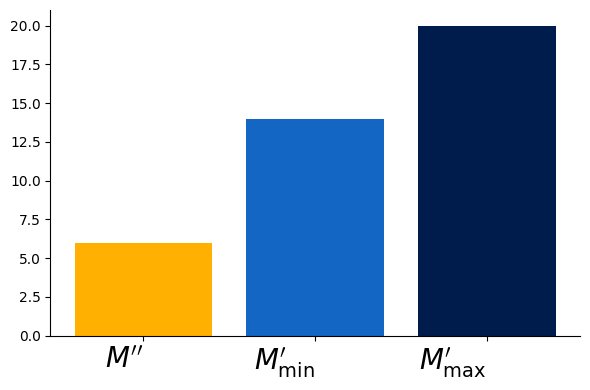

In [ ]:

# masks limited to crop
crop     = img22_all['x'].between(x0, x1) & img22_all['y'].between(y0, y1)
mask_def = (img22_all['label'] == 'defect') & crop
mask_atm = (img22_all['label'] == 'atom')   & crop

# Scatter plot
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111)

# optionally show image background
ax.imshow(img_crop, cmap='gray', origin='lower', extent=[x0, x1, y0, y1])

# defects ─ cyan outline, larger
ax.scatter(
    img22_all.loc[mask_def, 'x'],
    img22_all.loc[mask_def, 'y'],
    c=img22_all.loc[mask_def, 'group'].map(group_color),
    s=100, edgecolors='cyan', linewidth=2, zorder=1
)


# atoms ─ no outline, smaller
ax.scatter(
    img22_all.loc[mask_atm, 'x'],
    img22_all.loc[mask_atm, 'y'],
    c=img22_all.loc[mask_atm, 'group'].map(group_color),
    s=25, edgecolors='white', linewidth=.5, zorder=2, alpha = .9
)

ax.set_xlim(x0, x1)
ax.set_ylim(y0, y1)
ax.axis('off')
ax.set_aspect('equal')
plt.tight_layout()
h, w = img_crop.shape[:2]
xbar0 = w - bar_px - 10
xbar1 = w - 10
ybar  = h - 75

ax.plot([xbar0, xbar1], [ybar, ybar], color='white', lw=6)
#ax.text(xbar1, ybar - 2, f'{bar_nm} nm', color='white', fontsize=10, ha='right')


plt.show()


# Histogram of defect counts
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111)

layer_labels = [
    '$M^{\\prime\\prime}$',
    '$M^{\\prime}_{\\mathrm{min}}$',
    '$M^{\\prime}_{\\mathrm{max}}$'
]
counts = (img22_all.loc[mask_def, 'group']
          .value_counts()
          .reindex([1, 2, 3])
          .fillna(0))

ax.bar(
    range(3),
    counts.values,
    color=[group_color[g] for g in (1, 2, 3)]
)
#ax.set_ylabel('Defect count')
ax.set_xticks(range(3))
ax.set_xticklabels(layer_labels, rotation=0, ha='right', size=20)
#ax.set_title("Defect Counts by Layer")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)   
plt.tight_layout()
plt.show()


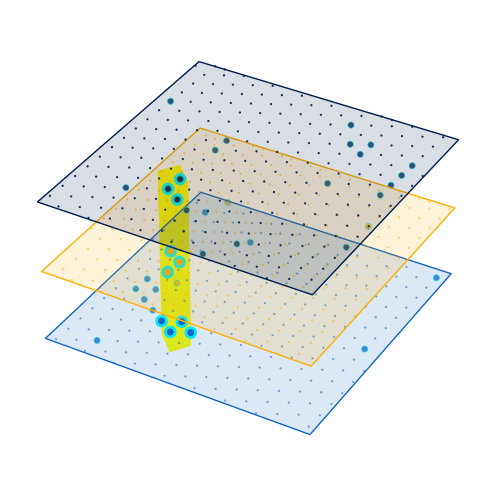

In [25]:
plt.close('all')
layer_z_map     = {1: 0, 2: -.5, 3: .5}
layer_alpha_map = {1: .5, 2: .5, 3: .9}

# crop
df_roi = img22_all.query("x>=@x0 & x<=@x1 & y>=@y0 & y<=@y1").copy()

fig = plt.figure(figsize=(5, 5))
ax  = fig.add_subplot(111, projection='3d')
ax.set_xlim(x0, x1)
ax.set_ylim(y0, y1)

# ── atoms and defects, coloured by layer ───────────────────────────────
for lid, z in layer_z_map.items():
    ma = (df_roi['label'] == 'atom')   & (df_roi['group'] == lid)
    md = (df_roi['label'] == 'defect') & (df_roi['group'] == lid)

    ax.scatter(df_roi.loc[ma, 'x'], df_roi.loc[ma, 'y'], z,
               c=df_roi.loc[ma, 'group'].map(group_color),
               s=.4, alpha=layer_alpha_map[lid])

    ax.scatter(df_roi.loc[md, 'x'], df_roi.loc[md, 'y'], z,
               c=df_roi.loc[md, 'group'].map(group_color),
               s=20, edgecolors='cyan', lw=.5, alpha=.75)

    ax.add_collection3d(
        Poly3DCollection([[(x0,y0,z), (x1,y0,z), (x1,y1,z), (x0,y1,z)]],
                         color=group_color[lid], alpha=.15)
    )

# ── hull around all nanopore defects ──────────────────────────────────
np_xy = (df_roi.query("label=='defect'")
               .query("category.str.contains('nanopore', na=False)"))[['x', 'y']].to_numpy()

if len(np_xy) >= 3:
    hull = np_xy[ConvexHull(np_xy).vertices]
    z_low, z_up = min(layer_z_map.values())-.1, max(layer_z_map.values())+.1

    faces = [
        [(*p, z_low) for p in hull],
        [(*p, z_up)  for p in hull],
        *[[(hull[i][0], hull[i][1], z_low),
           (hull[(i+1)%len(hull)][0], hull[(i+1)%len(hull)][1], z_low),
           (hull[(i+1)%len(hull)][0], hull[(i+1)%len(hull)][1], z_up),
           (hull[i][0], hull[i][1], z_up)] for i in range(len(hull))]
    ]
    ax.add_collection3d(
        Poly3DCollection(faces, facecolor='yellow',
                         edgecolor='cyan', alpha=.9, linewidths=0)
    ).set_sort_zpos(-2)

df_np = df_roi.query("label=='defect' & category.str.contains('nanopore', na=False)")
z_np  = df_np['group'].map(layer_z_map).values

ax.scatter(df_np['x'], df_np['y'], z_np,
           c=df_np['group'].map(group_color),
           s=50, edgecolors='cyan', lw=2,
           depthshade=False, zorder=20)

ax.axis('off')
ax.view_init(35, -60)
plt.tight_layout()
plt.show()


In [26]:
df_np

,percent,sample_id,group,label,vac_size,category,cluster_uid,x,y,flat_cat
139537,12_5,16,2,defect,4.0,nanopore,12_5_16_14,102.652,270.518,[nanopore]
139575,12_5,16,1,defect,4.0,nanopore,12_5_16_14,109.068,280.398,[nanopore]
139576,12_5,16,2,defect,4.0,nanopore,12_5_16_14,120.831,279.771,[nanopore]
139578,12_5,16,2,defect,4.0,nanopore,12_5_16_14,103.720,290.904,[nanopore]
139580,12_5,16,3,defect,4.0,nanopore,12_5_16_14,98.372,301.411,[nanopore]
139599,12_5,16,1,defect,4.0,nanopore,12_5_16_14,107.999,260.011,[nanopore]
139600,12_5,16,3,defect,4.0,nanopore,12_5_16_14,114.415,269.891,[nanopore]
139601,12_5,16,2,defect,4.0,nanopore,12_5_16_14,85.540,281.651,[nanopore]
139602,12_5,16,1,defect,4.0,nanopore,12_5_16_14,91.956,291.531,[nanopore]
139603,12_5,16,3,defect,4.0,nanopore,12_5_16_14,97.304,281.025,[nanopore]


In [27]:
df_roi["category"].unique()

array(['atom', 'isolated vacancy', 'surface_cluster', 'pit', 'nanopore',
       'complex'], dtype=object)

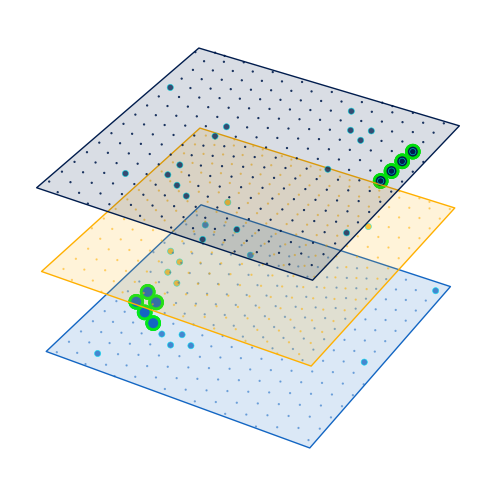

In [28]:
plt.close('all')
layer_z_map     = {1: 0, 2: -.5, 3: .5}
layer_alpha_map = {1: .5, 2: .5, 3: .9}

# crop
df_roi = img22_all.query("x>=@x0 & x<=@x1 & y>=@y0 & y<=@y1").copy()

fig = plt.figure(figsize=(5, 5))
ax  = fig.add_subplot(111, projection='3d')
ax.set_xlim(x0, x1)
ax.set_ylim(y0, y1)
df_np = df_roi.query(
    "label=='defect' & category.str.contains('surface_cluster', na=False)"
)

# z for each point
z_np = df_np['group'].map(layer_z_map).values

# ── atoms and defects, coloured by layer ───────────────────────────────
for lid, z in layer_z_map.items():
    ma = (df_roi['label'] == 'atom')   & (df_roi['group'] == lid)
    md = (df_roi['label'] == 'defect') & (df_roi['group'] == lid)

    ax.scatter(df_roi.loc[ma, 'x'], df_roi.loc[ma, 'y'], z,
               c=df_roi.loc[ma, 'group'].map(group_color),
               s=.4, alpha=layer_alpha_map[lid])

    ax.scatter(df_roi.loc[md, 'x'], df_roi.loc[md, 'y'], z,
               c=df_roi.loc[md, 'group'].map(group_color),
               s=20, edgecolors='cyan', lw=.5, alpha=.75)

    df_np_interior = df_np.query("x>@x0+5 & x<@x1-5 & y>@y0+5 & y<@y1-5")
    z_np_int       = df_np_interior['group'].map(layer_z_map).values

    ax.scatter(df_np_interior['x'], df_np_interior['y'], z_np_int,
            c=df_np_interior['group'].map(group_color),
            s=85, edgecolors='lime', lw=2,
            alpha=1, depthshade=False, zorder=20)





    ax.add_collection3d(
        Poly3DCollection([[(x0,y0,z), (x1,y0,z), (x1,y1,z), (x0,y1,z)]],
                         color=group_color[lid], alpha=.15)
    )


ax.axis('off')
ax.view_init(35, -60)
plt.tight_layout()
plt.show()


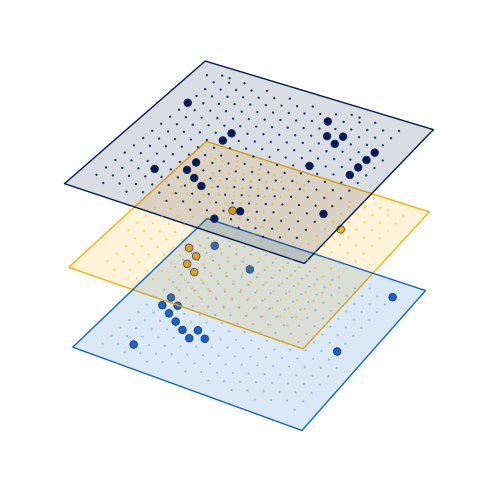

In [29]:
grp_z     = {1: 0, 2: -1.5, 3:  1.5}
alpha_map = {1: .5, 2:  .3, 3: .9}

fig3d = plt.figure(figsize=(5, 5))          # wider canvas (was 6×6)
ax3d  = fig3d.add_subplot(111, projection='3d')

mask_def = (df_roi['label'] == 'defect') 
mask_atm = (df_roi['label'] == 'atom')   

for g, zpos in [(2, 0), (1, 1), (3, 2)]:
    z    = grp_z[g]
    m_at =  mask_atm & (df_roi['group'] == g)
    m_df =  mask_def & (df_roi['group'] == g)

    ax3d.scatter(df_roi.loc[m_at, 'x'],
                 df_roi.loc[m_at, 'y'], z,
                 c=df_roi.loc[m_at, 'group'].map(group_color),
                 s=.4, alpha=alpha_map[g], depthshade=True
                 ).set_sort_zpos(zpos)

    ax3d.scatter(df_roi.loc[m_df, 'x'],
                 df_roi.loc[m_df, 'y'], z,
                 c=df_roi.loc[m_df, 'group'].map(group_color),
                 s=30, edgecolors='midnightblue', linewidth= .5,
                 depthshade=False).set_sort_zpos(zpos + .1)


# ── yellow prism spanning all layers ─────────────────────────────────────
np_pts = img22_all.loc[
    mask_def & (img22_all['category'] == 'nanopore'), ['x', 'y']].to_numpy()


# ── thin translucent planes *after* limits are frozen ────────────────────
x0, x1 = ax3d.get_xlim()
y0, y1 = ax3d.get_ylim()
#rect   = [(x0+150, y0+50), (x1+10, y0+50), (x1+10, y1-30), (x0+150, y1-30)]
rect   = [(x0, y0), (x1, y0), (x1, y1), (x0, y1)]

for g, z in grp_z.items():
    ax3d.add_collection3d(
        Poly3DCollection([[(*p, z) for p in rect]],
                         color=group_color[g], alpha=.15, linewidths=1)
    ).set_sort_zpos(-1)

# ── limits & view first ──────────────────────────────────────────────────
ax3d.set_axis_off()
ax3d.view_init(35, -60)

plt.tight_layout()
plt.show()


Loading .cif file for Ti3C2_Pristine
Success!  Visualizing (6 x 4 x 1) Ti3C2_Pristine supercell


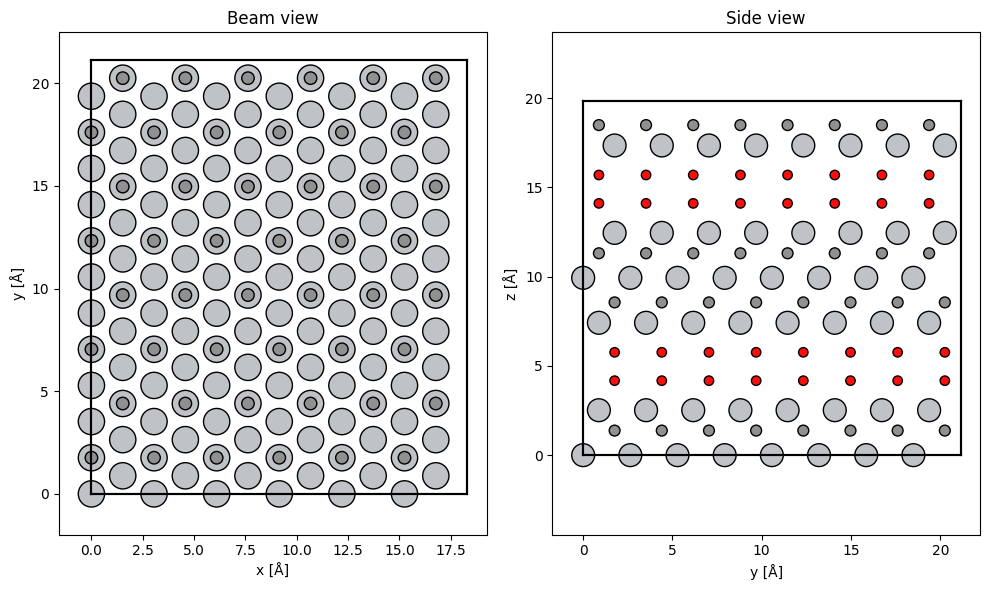

In [32]:
cifpath = "Ti3C2_Pristine.cif"
commonname='MXene'
material = cifpath.split("/")[-1].replace(".cif", "")
print(f"Loading .cif file for {material}")

Ti3C2 = ase.io.read(cifpath) 
Ti3C2_orthogonal, transform = abtem.atoms.orthogonalize_cell(Ti3C2,return_transform=True)

"""
## uncomment to visualize unit cells
abtem.show_atoms(Ti3C2, show_periodic=True, scale=0.5, legend=True,);
abtem.show_atoms(Ti3C2_orthogonal, show_periodic=True, scale=0.5, legend=True,);
"""

tilex=6
tiley=4
tilez=1
repeated_Ti3C2 = Ti3C2_orthogonal * (tilex, tiley, tilez)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))
abtem.show_atoms(repeated_Ti3C2, ax=ax1, numbering=False, title="Beam view", scale = .4)
abtem.show_atoms(repeated_Ti3C2, ax=ax2, plane="yz", title="Side view", scale = .4)
fig.tight_layout();

print(f"Success!  Visualizing ({tilex} x {tiley} x {tilez}) {material} supercell")


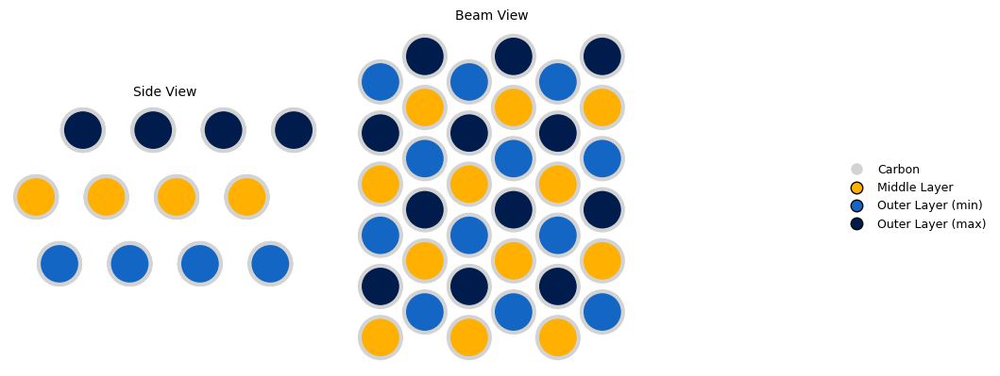

In [34]:
# ── coords & masks ──────────────────────────────────────────────────────
pos   = sc.positions
x, y, z = pos[:, 0], pos[:, 1], pos[:, 2]

symbols = np.asarray(sc.get_chemical_symbols())
ti_mask, c_mask = symbols == 'Ti', symbols == 'C'

layers = np.where(z[ti_mask] < 8, 2, np.where(z[ti_mask] > 12, 3, 1))
ti_col = np.vectorize(group_color.get)(layers)

# ── plot Y-Z and X-Y projections ────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(9, 4))
projs = [(y, z, 'Side View'), (x, y, 'Beam View')]

for ax, (xp, yp, ttl) in zip(axes, projs):
    ax.set_aspect('equal'); ax.axis('off')
    
    # carbon
    ax.scatter(xp[c_mask], yp[c_mask], c='#D3D3D3', s=0, alpha=0.3, zorder=1, linewidth=0)
    # Ti
    ax.scatter(xp[ti_mask], yp[ti_mask], c=ti_col, s=1000,
               edgecolors='lightgray', linewidth=3, zorder=2)
    
    pad = 1.0
    ax.set_xlim(xp.min() - pad, xp.max() + pad)
    ax.set_ylim(yp.min() - pad, yp.max() + pad)
    ax.set_title(ttl, fontsize=10)

# ── legend (single, outside) ────────────────────────────────────────────
from matplotlib.lines import Line2D
handles = [Line2D([], [], marker='o', color='none',
                  markerfacecolor=group_color[i], markeredgecolor='black',
                  markersize=9, label=lbl)
           for i, lbl in zip((1, 2, 3),
           ["Middle Layer", "Outer Layer (min)", "Outer Layer (max)"])]
handles.insert(0, Line2D([], [], marker='o', color='none',
                         markerfacecolor='#D3D3D3', markeredgecolor='none',
                         markersize=9, label='Carbon'))

fig.legend(handles=handles, bbox_to_anchor=(1.02, 0.5), loc='center left',
           frameon=False, fontsize=9)

fig.subplots_adjust(left=0.05, right=0.8, bottom=0.05, top=0.95, wspace=0.05)
plt.show()




